<a href="https://colab.research.google.com/github/namigabbasov/ai-literacy-bibliometric-analysis/blob/main/scripts/RQ1_venue_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **RQ1 – Knowledge Dissemination: Where is AI Literacy Research Published?**

## Setup: Install and Import Required Libraries

In [3]:
!pip install -q pandas numpy matplotlib seaborn plotly networkx openpyxl tqdm nltk spacy scikit-learn wordcloud


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import networkx as nx

import nltk
import re
from wordcloud import WordCloud
from collections import Counter
from tqdm import tqdm
import textwrap

#nltk.download('stopwords')
#nltk.download('punkt')

### Display settings
pd.set_option('display.max_columns', 50)
sns.set_theme(style="whitegrid", palette="deep")

## Load AI Literacy Dataset from GitHub

In [4]:
url = "https://raw.githubusercontent.com/namigabbasov/ai-literacy-bibliometric-analysis/refs/heads/main/data/ai_literacy.csv"
df = pd.read_csv(url, low_memory=False)

## Explore Data

In [5]:
list(df.columns)

['Authors',
 'Author full names',
 'Author(s) ID',
 'Title',
 'Year',
 'Source title',
 'Volume',
 'Issue',
 'Art. No.',
 'Page start',
 'Page end',
 'Page count',
 'Cited by',
 'DOI',
 'Link',
 'Affiliations',
 'Authors with affiliations',
 'Abstract',
 'Author Keywords',
 'Index Keywords',
 'Molecular Sequence Numbers',
 'Chemicals/CAS',
 'Tradenames',
 'Manufacturers',
 'Funding Details',
 'Funding Texts',
 'References',
 'Correspondence Address',
 'Editors',
 'Publisher',
 'Sponsors',
 'Conference name',
 'Conference date',
 'Conference location',
 'Conference code',
 'ISSN',
 'ISBN',
 'CODEN',
 'PubMed ID',
 'Language of Original Document',
 'Abbreviated Source Title',
 'Document Type',
 'Publication Stage',
 'Open Access',
 'Source',
 'EID']

In [6]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 2227 entries, 0 to 2226
Data columns (total 46 columns):
 #   Column                         Non-Null Count  Dtype
---  ------                         --------------  -----
 0   Authors                        2176 non-null   str  
 1   Author full names              2176 non-null   str  
 2   Author(s) ID                   2176 non-null   str  
 3   Title                          2224 non-null   str  
 4   Year                           2224 non-null   str  
 5   Source title                   1758 non-null   str  
 6   Volume                         1504 non-null   str  
 7   Issue                          899 non-null    str  
 8   Art. No.                       658 non-null    str  
 9   Page start                     1227 non-null   str  
 10  Page end                       1215 non-null   str  
 11  Page count                     2224 non-null   str  
 12  Cited by                       2224 non-null   str  
 13  DOI                          

In [7]:
### Keep essential columns for analysis
keep_cols = [
    'Authors', 'Title', 'Year', 'Source title', 'Author Keywords', 'Index Keywords',
    'Abstract', 'Cited by', 'Affiliations', 'DOI', 'Document Type', 'Conference name',
    'Publisher', 'Language of Original Document', 'Open Access', 'EID'
]
df = df[keep_cols].copy()

### Drop duplicates and missing titles/years
df.drop_duplicates(subset='Title', keep='first', inplace=True)
df = df[df['Title'].notna() & df['Year'].notna()].copy()

### Convert year to integer
df['Year'] = pd.to_numeric(df['Year'], errors='coerce').astype('Int64')

### Clean up 'Document Type' column
df['Document Type'] = df['Document Type'].astype(str).str.strip()

### Remove rows with missing or blank Document Type
df = df[df['Document Type'].notna() & (df['Document Type'] != '')].copy()

### Drop unwanted document types (including corrupted one)
drop_types = [
    'Erratum', 'Letter', 'Data paper',
    'Retracted', 'Short survey'
]

mask = df['Document Type'].isin(drop_types) | df['Document Type'].str.contains(
    'Godspeed scale|anthropomorphism', case=False, na=False
)

before = len(df)
df_clean = df[~mask].copy()
after = len(df_clean)

### Summary
print("Clean dataset created.")
print(f"Records before cleaning: {before:,}")
print(f"Records after cleaning:  {after:,}")
print(f"Records dropped:        {before - after:,}")
print(f"Year range: {df_clean['Year'].min()}–{df_clean['Year'].max()}")
print("\nUnique document types retained:")
print(df_clean['Document Type'].value_counts())


Clean dataset created.
Records before cleaning: 2,209
Records after cleaning:  2,197
Records dropped:        12
Year range: 2016–2025

Unique document types retained:
Document Type
Article              1177
Conference paper      593
Book chapter          199
Review                122
Note                   39
Conference review      32
Editorial              23
Book                   12
Name: count, dtype: int64


In [8]:
### Keep essential columns for analysis
keep_cols = [
    'Authors', 'Title', 'Year', 'Source title', 'Author Keywords', 'Index Keywords',
    'Abstract', 'Cited by', 'Affiliations', 'DOI', 'Document Type', 'Conference name',
    'Publisher', 'Language of Original Document', 'Open Access', 'EID'
]
df = df[keep_cols].copy()

### Drop duplicates and missing titles/years
df.drop_duplicates(subset='Title', keep='first', inplace=True)
df = df[df['Title'].notna() & df['Year'].notna()].copy()

### Convert year to integer
df['Year'] = pd.to_numeric(df['Year'], errors='coerce').astype('Int64')

### Clean up 'Document Type' column a bit
df['Document Type'] = df['Document Type'].astype(str).str.strip()

### Drop unwanted document types (including corrupted one)
drop_types = [
    'Erratum', 'Letter', 'Data paper',
    'Retracted', 'Short survey'
]

mask = df['Document Type'].isin(drop_types) | df['Document Type'].str.contains(
    'Godspeed scale|anthropomorphism', case=False, na=False
)

before = len(df)
df_clean = df[~mask].copy()
after = len(df_clean)

### Summary
print("Clean dataset created.")
print(f"Records before cleaning: {before:,}")
print(f"Records after cleaning:  {after:,}")
print(f"Records dropped:        {before - after:,}")
print(f"Year range: {df_clean['Year'].min()}–{df_clean['Year'].max()}")
print("\nUnique document types retained:")
print(df_clean['Document Type'].value_counts())


Clean dataset created.
Records before cleaning: 2,208
Records after cleaning:  2,197
Records dropped:        11
Year range: 2016–2025

Unique document types retained:
Document Type
Article              1177
Conference paper      593
Book chapter          199
Review                122
Note                   39
Conference review      32
Editorial              23
Book                   12
Name: count, dtype: int64


## Plots of Publication Avenues

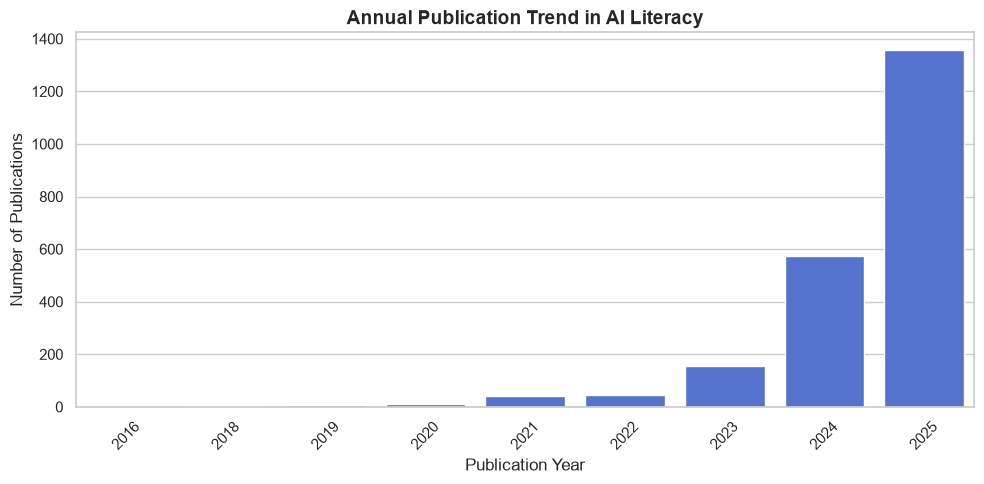

In [9]:
### Annual publication trends
pubs_by_year = df_clean['Year'].value_counts().sort_index()
plt.figure(figsize=(10,5))
sns.barplot(x=pubs_by_year.index, y=pubs_by_year.values, color='royalblue')
plt.title("Annual Publication Trend in AI Literacy", fontsize=14, weight='bold')
plt.xlabel("Publication Year")
plt.ylabel("Number of Publications")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

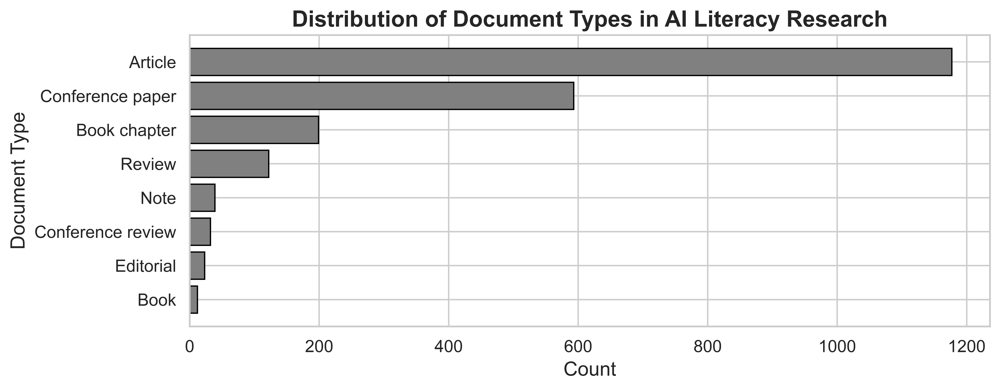

In [10]:
df_doc = df_clean.copy()
df_doc['Document Type'] = df_doc['Document Type'].astype(str).str.strip()
mask_valid = (
    df_doc['Document Type'].notna() &
    (df_doc['Document Type'].str.lower() != 'nan') &
    (df_doc['Document Type'] != '')
)
df_doc = df_doc[mask_valid]
doc_types = df_doc['Document Type'].value_counts().sort_values(ascending=False)



plt.figure(figsize=(10, 4), dpi=1000)
plt.barh(
    doc_types.index,
    doc_types.values,
    color="gray",
    edgecolor="black",
    linewidth=0.9
)
plt.title("Distribution of Document Types in AI Literacy Research",
          fontsize=16, fontweight='bold')
plt.xlabel("Count", fontsize=14)
plt.ylabel("Document Type", fontsize=14)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)


plt.gca().invert_yaxis()

plt.subplots_adjust(left=0.28)

plt.tight_layout()
plt.show()


In [11]:
df['Cited by'] = pd.to_numeric(df['Cited by'], errors='coerce').fillna(0)
top10_count = df['Source title'].value_counts().head(10)
labels = [textwrap.fill(str(v), 35) for v in top10_count.index]


plt.figure(figsize=(10, 6), dpi=1000)
plt.barh(
    labels,
    top10_count.values,
    color="gray",
    edgecolor="black",
    linewidth=0.9
)
plt.title(
    "Top 10 Publication Venues for AI Literacy Research",
    fontsize=16,
    fontweight='bold'
)
plt.xlabel("Number of Publications", fontsize=14)
plt.ylabel("Venue", fontsize=14)
plt.gca().invert_yaxis()
plt.xticks(fontsize=12)
plt.yticks(fontsize=11)
plt.subplots_adjust(left=0.32)
plt.tight_layout()
plt.show()

In [12]:
df['Cited by'] = pd.to_numeric(df['Cited by'], errors='coerce').fillna(0)
top10_total_cites = (
    df.groupby("Source title")["Cited by"]
      .sum()
      .sort_values(ascending=False)
      .head(10)
)
labels = [textwrap.fill(str(v), 35) for v in top10_total_cites.index]


plt.figure(figsize=(12, 6), dpi=1000)
plt.barh(labels, top10_total_cites.values,
         color="gray", edgecolor="black", linewidth=0.9)
plt.title("Top 10 Publication Venues by Total Citations (AI Literacy Research)",
          fontsize=16, fontweight='bold')
plt.xlabel("Total Citations", fontsize=14)
plt.ylabel("Venue", fontsize=14)
plt.gca().invert_yaxis()
plt.xticks(fontsize=12)
plt.yticks(fontsize=11)
plt.subplots_adjust(left=0.32)
plt.tight_layout()
plt.show()

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import textwrap

# Make sure citation column is numeric
df["Cited by"] = pd.to_numeric(df["Cited by"], errors="coerce").fillna(0)

# Panel A: Top 10 venues by number of publications
top10_count = df["Source title"].value_counts().head(10)
labels_count = [textwrap.fill(str(v), 35) for v in top10_count.index]

# Panel B: Top 10 venues by total citations
top10_total_cites = (
    df.groupby("Source title")["Cited by"]
      .sum()
      .sort_values(ascending=False)
      .head(10)
)
labels_cites = [textwrap.fill(str(v), 35) for v in top10_total_cites.index]

# Create one figure with two panels
fig, axes = plt.subplots(
    nrows=2,
    ncols=1,
    figsize=(12, 11),
    dpi=1000
)

# -----------------------
# Panel A: Publications
# -----------------------
axes[0].barh(
    labels_count,
    top10_count.values,
    color="gray",
    edgecolor="black",
    linewidth=0.9
)

axes[0].invert_yaxis()
axes[0].set_title(
    "A. By Number of Publications",
    fontsize=15,
    fontweight="bold",
    loc="left"
)
axes[0].set_xlabel("Number of Publications", fontsize=13)
axes[0].set_ylabel("Venue", fontsize=13)
axes[0].tick_params(axis="x", labelsize=11)
axes[0].tick_params(axis="y", labelsize=10)

# -----------------------
# Panel B: Citations
# -----------------------
axes[1].barh(
    labels_cites,
    top10_total_cites.values,
    color="gray",
    edgecolor="black",
    linewidth=0.9
)

axes[1].invert_yaxis()
axes[1].set_title(
    "B. By Total Citations",
    fontsize=15,
    fontweight="bold",
    loc="left"
)
axes[1].set_xlabel("Total Citations", fontsize=13)
axes[1].set_ylabel("Venue", fontsize=13)
axes[1].tick_params(axis="x", labelsize=11)
axes[1].tick_params(axis="y", labelsize=10)

# Overall figure title
fig.suptitle(
    "Top Venues for AI Literacy Research",
    fontsize=17,
    fontweight="bold",
    y=0.995
)

# Adjust spacing
plt.tight_layout()
plt.subplots_adjust(
    top=0.93,
    left=0.34,
    hspace=0.35
)

plt.show()

In [13]:
df['Cited by'] = pd.to_numeric(df['Cited by'], errors='coerce').fillna(0)
top10_mean_cites = (
    df.groupby("Source title")["Cited by"]
      .mean()
      .sort_values(ascending=False)
      .head(10)
)
labels = [textwrap.fill(str(v), 40) for v in top10_mean_cites.index]

plt.figure(figsize=(13, 6), dpi=1000)
plt.barh(labels, top10_mean_cites.values,
         color="gray", edgecolor="black", linewidth=0.9)

plt.title("Top 10 Publication Venues by Mean Citations per AI Literacy Paper",
          fontsize=16, fontweight='bold')
plt.xlabel("Mean Citations", fontsize=14)
plt.ylabel("Venue", fontsize=14)
plt.gca().invert_yaxis()
plt.xticks(fontsize=12)
plt.yticks(fontsize=11)
plt.subplots_adjust(left=0.32)
plt.tight_layout()
plt.show()

In [14]:
df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
pubs_per_year = df.groupby("Year").size()

plt.figure(figsize=(12, 6), dpi=1000)
plt.plot(pubs_per_year.index, pubs_per_year.values,
         marker="o", color="black", linewidth=1.5)
plt.title("AI Literacy Publications Over Time", fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=14)
plt.ylabel("Number of Publications", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linewidth=0.5, color="gray", alpha=0.7)
plt.tight_layout()
plt.show()

In [15]:
df_doc = df.copy()
df_doc['Document Type'] = df_doc['Document Type'].astype(str).str.strip()
drop_types = [
    'Erratum', 'Letter', 'Data paper',
    'Retracted', 'Short survey'
]

mask_drop = (
    df_doc['Document Type'].isin(drop_types) |
    df_doc['Document Type'].str.contains('Godspeed scale|anthropomorphism',
                                         case=False, na=False)
)

df_doc = df_doc[~mask_drop]
df_doc = df_doc[
    df_doc['Document Type'].notna() &
    (df_doc['Document Type'].str.lower() != 'nan') &
    (df_doc['Document Type'] != '')
]
df_doc['Year'] = pd.to_numeric(df_doc['Year'], errors='coerce')
df_doc = df_doc[df_doc['Year'].notna()]
pubs_year_type = (
    df_doc.groupby(['Year', 'Document Type'])
          .size()
          .unstack(fill_value=0)
)


plt.figure(figsize=(12, 7), dpi=1000)
for doc_type in pubs_year_type.columns:
    plt.plot(
        pubs_year_type.index,
        pubs_year_type[doc_type],
        marker="o",
        linewidth=1.5,
        label=doc_type
    )
plt.title("AI Literacy Publications by Document Type Over Time",
          fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=14)
plt.ylabel("Number of Publications", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linewidth=0.5, color="gray", alpha=0.7)
plt.legend(title="Document Type", fontsize=11, title_fontsize=12,
           loc="upper left", bbox_to_anchor=(0,1))
plt.tight_layout()
plt.show()

In [30]:
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------
# Clean year variable
# -----------------------
df["Year"] = pd.to_numeric(df["Year"], errors="coerce")
df = df[df["Year"].notna()].copy()
df["Year"] = df["Year"].astype(int)

# -----------------------
# Clean document types
# -----------------------
df_doc = df.copy()
df_doc["Document Type"] = df_doc["Document Type"].astype(str).str.strip()

drop_types = [
    "Erratum", "Letter", "Data paper",
    "Retracted", "Short survey"
]

mask_drop = (
    df_doc["Document Type"].isin(drop_types) |
    df_doc["Document Type"].str.contains(
        "Godspeed scale|anthropomorphism",
        case=False,
        na=False
    )
)

df_doc = df_doc[~mask_drop]

df_doc = df_doc[
    df_doc["Document Type"].notna() &
    (df_doc["Document Type"].str.lower() != "nan") &
    (df_doc["Document Type"] != "")
]

# -----------------------
# Keep main document types, group the rest as Other
# -----------------------
main_types = ["Article", "Conference paper", "Book chapter", "Review"]

df_doc["Document Type Clean"] = df_doc["Document Type"].apply(
    lambda x: x if x in main_types else "Other"
)

# -----------------------
# Data preparation
# -----------------------
pubs_year_type = (
    df_doc.groupby(["Year", "Document Type Clean"])
          .size()
          .unstack(fill_value=0)
)

# Important: calculate total from the same cleaned dataset
pubs_per_year = df_doc.groupby("Year").size()

ordered_cols = [x for x in main_types + ["Other"] if x in pubs_year_type.columns]
pubs_year_type = pubs_year_type[ordered_cols]

# -----------------------
# Plot
# -----------------------
fig, ax = plt.subplots(figsize=(12, 7), dpi=1000)

# Total line
ax.plot(
    pubs_per_year.index,
    pubs_per_year.values,
    marker="o",
    linewidth=2.8,
    color="black",
    label="Total publications"
)

# Document type lines
line_styles = {
    "Article": "-",
    "Conference paper": "--",
    "Book chapter": "-.",
    "Review": ":",
    "Other": "-"
}

markers = {
    "Article": "o",
    "Conference paper": "s",
    "Book chapter": "^",
    "Review": "D",
    "Other": "v"
}

for col in pubs_year_type.columns:
    ax.plot(
        pubs_year_type.index,
        pubs_year_type[col],
        marker=markers.get(col, "o"),
        linestyle=line_styles.get(col, "-"),
        linewidth=1.8,
        label=col
    )

ax.set_title(
    "Growth of AI Literacy Research by Document Type",
    fontsize=16,
    fontweight="bold"
)

ax.set_xlabel("Year", fontsize=14)
ax.set_ylabel("Number of Publications", fontsize=14)

# Show every year in the corpus
ax.set_xticks(sorted(df_doc["Year"].unique()))

ax.tick_params(axis="x", labelsize=12, rotation=0)
ax.tick_params(axis="y", labelsize=12)

ax.grid(
    True,
    axis="y",
    linewidth=0.5,
    color="gray",
    alpha=0.6
)

ax.legend(
    title="Document Type",
    fontsize=10,
    title_fontsize=11,
    loc="upper left",
    frameon=True
)

plt.tight_layout()
plt.show()

In [35]:
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------
# Clean year variable
# -----------------------
df["Year"] = pd.to_numeric(df["Year"], errors="coerce")
df = df[df["Year"].notna()].copy()
df["Year"] = df["Year"].astype(int)

# -----------------------
# Clean document types
# -----------------------
df_doc = df.copy()
df_doc["Document Type"] = df_doc["Document Type"].astype(str).str.strip()

drop_types = [
    "Erratum", "Letter", "Data paper",
    "Retracted", "Short survey"
]

mask_drop = (
    df_doc["Document Type"].isin(drop_types) |
    df_doc["Document Type"].str.contains(
        "Godspeed scale|anthropomorphism",
        case=False,
        na=False
    )
)

df_doc = df_doc[~mask_drop]

df_doc = df_doc[
    df_doc["Document Type"].notna() &
    (df_doc["Document Type"].str.lower() != "nan") &
    (df_doc["Document Type"] != "")
]

# -----------------------
# Keep main document types and group smaller ones as Other
# -----------------------
main_types = ["Article", "Conference paper", "Book chapter", "Review"]

df_doc["Document Type Clean"] = df_doc["Document Type"].apply(
    lambda x: x if x in main_types else "Other"
)

# -----------------------
# Publications by year and document type
# -----------------------
pubs_year_type = (
    df_doc.groupby(["Year", "Document Type Clean"])
          .size()
          .unstack(fill_value=0)
)

# Order columns
ordered_cols = [x for x in main_types + ["Other"] if x in pubs_year_type.columns]
pubs_year_type = pubs_year_type[ordered_cols]

# -----------------------
# Plot stacked bar chart
# -----------------------
fig, ax = plt.subplots(figsize=(12, 7), dpi=1000)

pubs_year_type.plot(
    kind="bar",
    stacked=True,
    ax=ax,
    edgecolor="black",
    linewidth=0.4
)

ax.set_title(
    "Growth of AI Literacy Research by Document Type",
    fontsize=16,
    fontweight="bold"
)

ax.set_xlabel("Year", fontsize=16)
ax.set_ylabel("Number of Publications", fontsize=16)

ax.tick_params(axis="x", labelsize=12, rotation=0)
ax.tick_params(axis="y", labelsize=12)

ax.grid(
    True,
    axis="y",
    linewidth=0.5,
    color="gray",
    alpha=0.6
)

ax.legend(
    title="Document Type",
    fontsize=14,
    title_fontsize=16,
    loc="upper left",
    frameon=True
)

plt.tight_layout()
plt.show()

## AI Literacy Summary Table

In [17]:
summary = {}

### Core dataset info
summary["Total Documents"] = len(df_clean)
summary["Timespan"] = f"{df_clean['Year'].min()}–{df_clean['Year'].max()}"

### Citations
if "Cited by" in df_clean.columns:
    df_clean["Cited by"] = pd.to_numeric(df_clean["Cited by"], errors="coerce")
    summary["Total Citations"] = int(df_clean["Cited by"].sum(skipna=True))
    summary["Average Citations per Document"] = round(df_clean["Cited by"].mean(skipna=True), 2)

### Annual growth rate
years = df_clean["Year"].dropna().astype(int)
yearly_counts = years.value_counts().sort_index()
if len(yearly_counts) > 1:
    growth_rate = ((yearly_counts.iloc[-1] / yearly_counts.iloc[0]) ** (1 / (len(yearly_counts) - 1)) - 1) * 100
    summary["Average Annual Growth Rate (%)"] = round(growth_rate, 2)

### Document types
doc_counts = df_clean["Document Type"].value_counts()
summary["Document Types"] = ", ".join([f"{k}: {v}" for k, v in doc_counts.items()])

### Open Access proportion
if "Open Access" in df_clean.columns:
    oa_rate = (df_clean["Open Access"].astype(str).str.lower() == "all").mean() * 100
    summary["Open Access (%)"] = round(oa_rate, 2)

### Author analysis
authors_series = df_clean["Authors"].dropna().str.split(";")
total_authorships = authors_series.apply(len).sum()
avg_authors_per_doc = total_authorships / len(authors_series)
summary["Average Authors per Document"] = round(avg_authors_per_doc, 2)

### Identify most prolific authors
from collections import Counter
authors_flat = [a.strip() for lst in authors_series for a in lst if a.strip()]
top_authors = Counter(authors_flat).most_common(10)
summary["Top Authors"] = ", ".join([f"{a} ({c})" for a, c in top_authors])

### Countries (extract from affiliations text)
if "Affiliations" in df_clean.columns:
    # Rough extraction: last comma segment tends to be country name
    affils = df_clean["Affiliations"].dropna().astype(str)
    countries = affils.str.extractall(r",\s*([A-Za-z\s]+)$")[0].str.strip()
    top_countries = countries.value_counts().head(10)
    summary["Top Countries"] = ", ".join([f"{c} ({n})" for c, n in top_countries.items()])

### Document age
summary["Average Document Age (years)"] = round(2025 - df_clean["Year"].mean(), 1)

### Build DataFrame
summary_df = pd.DataFrame(list(summary.items()), columns=["Metric", "Value"])
display(summary_df)

,Metric,Value
0,Total Documents,2197
1,Timespan,2016–2025
2,Total Citations,28533
3,Average Citations per Document,12.99
4,Average Annual Growth Rate (%),146.34
5,Document Types,"Article: 1177, Conference paper: 593, Book cha..."
6,Open Access (%),0.0
7,Average Authors per Document,3.52
8,Top Authors,"Ng, D.T.K. (24), Breazeal, C. (20), Yang, Y. (..."
9,Top Countries,"United States (506), China (213), Hong Kong (1..."


In [18]:
summary = {}
df_sum = df_clean.copy()
summary["Total Documents"] = len(df_sum)
years = pd.to_numeric(df_sum["Year"], errors="coerce").dropna().astype(int)
summary["Timespan"] = f"{years.min()}–{years.max()}"
df_sum["Cited by"] = pd.to_numeric(df_sum["Cited by"], errors="coerce").fillna(0)
summary["Total Citations"] = int(df_sum["Cited by"].sum())
summary["Average Citations per Document"] = round(df_sum["Cited by"].mean(), 2)


yearly_counts = years.value_counts().sort_index()

if len(yearly_counts) > 1:
    start = yearly_counts.iloc[0]
    end = yearly_counts.iloc[-1]
    n_years = len(yearly_counts) - 1
    cagr = ((end / start) ** (1 / n_years) - 1) * 100
    summary["Average Annual Growth Rate (%)"] = f"{cagr:.2f}"

doc_counts = df_sum["Document Type"].astype(str).str.strip()
mask_valid = (
    doc_counts.notna() &
    (doc_counts.str.lower() != "nan") &
    (doc_counts != "")
)
doc_counts = doc_counts[mask_valid].value_counts()

summary["Document Types"] = "; ".join([f"{k}: {v}" for k, v in doc_counts.items()])

if "Open Access" in df_sum.columns:
    oa_rate = df_sum["Open Access"].notna().mean() * 100
    summary["Open Access (%)"] = round(oa_rate, 2)


authors_series = df_sum["Authors"].dropna().astype(str).str.split(";")

total_authorships = authors_series.apply(len).sum()
avg_authors_per_doc = total_authorships / len(authors_series)
summary["Average Authors per Document"] = round(avg_authors_per_doc, 2)

authors_flat = [a.strip() for lst in authors_series for a in lst if a.strip()]
top_authors = Counter(authors_flat).most_common(10)
summary["Top Authors"] = "; ".join([f"{a} ({c})" for a, c in top_authors])


if "Affiliations" in df_sum.columns:
    affils = df_sum["Affiliations"].dropna().astype(str)

    # Extract last comma-separated segment as country (rough but common approach)
    countries = affils.str.extractall(r",\s*([A-Za-z][A-Za-z\s]+)$")[0].str.strip()

    if not countries.empty:
        top_countries = countries.value_counts().head(10)
        summary["Top Countries"] = "; ".join([f"{c} ({n})" for c, n in top_countries.items()])

summary["Average Document Age (years)"] = round(2025 - years.mean(), 1)

summary_df = pd.DataFrame(list(summary.items()), columns=["Metric", "Value"])
summary_df

,Metric,Value
0,Total Documents,2197
1,Timespan,2016–2025
2,Total Citations,28533
3,Average Citations per Document,12.99
4,Average Annual Growth Rate (%),146.34
5,Document Types,Article: 1177; Conference paper: 593; Book cha...
6,Open Access (%),44.38
7,Average Authors per Document,3.52
8,Top Authors,"Ng, D.T.K. (24); Breazeal, C. (20); Yang, Y. (..."
9,Top Countries,United States (506); China (213); Hong Kong (1...


In [19]:
summary_df.to_excel("AI_Literacy_Summary_Table.xlsx", index=False)